## Exercise: Implement t-SNE / UMAP for Customer Analysis (Retail Sales Data)

We want to explore if we want to analyze clusters regarding the item Category, and see if there's some relationship between clients that buy the same categories

* Step 1: Load dataset
* Step 2: Clean and encode the data
* Step 3: Apply t-SNE / UMAP
    * Step 3.1: Find the optimal perplexity value (when divergence becomes __constant__, choose the **lowest** perplexity value - Elbow Method)
    * Step 3.2: Choose that value as the ``perplexity`` value for t-SNE
    * Step 3.3: Visualize the result (choose the ``category`` field for ``y`` value)
* Step 4: Analyze clusters (if possible)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import plotly.express as px

### Step 1. Load dataset

In [16]:
df = pd.read_csv('customer_shopping_data.csv')
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon


In [17]:
# Drop unimportant columns
df = df.drop(['invoice_no', 'customer_id', 'invoice_date'], axis=1)
df.head()

,gender,age,category,quantity,price,payment_method,shopping_mall
0,Female,28,Clothing,5,1500.40,Credit Card,Kanyon
1,Male,21,Shoes,3,1800.51,Debit Card,Forum Istanbul
2,Male,20,Clothing,1,300.08,Cash,Metrocity
3,Female,66,Shoes,5,3000.85,Credit Card,Metropol AVM
4,Female,53,Books,4,60.60,Cash,Kanyon


In [18]:
# Number of categories
df['category'].value_counts()

category
Clothing           34487
Cosmetics          15097
Food & Beverage    14776
Toys               10087
Shoes              10034
Souvenir            4999
Technology          4996
Books               4981
Name: count, dtype: int64

In [19]:
# Number of payment methods
df['payment_method'].value_counts()

payment_method
Cash           44447
Credit Card    34931
Debit Card     20079
Name: count, dtype: int64

In [20]:
# Data shape
df.shape

(99457, 7)

### Step 2. Encode the data

In [21]:
from sklearn.preprocessing import OrdinalEncoder
le = OrdinalEncoder()
#df['gender'] = le.fit_transform(df[['gender']])
#df['category'] = le.fit_transform(df[['category']])
#df['payment_method'] = le.fit_transform(df[['payment_method']])
#df['shopping_mall'] = le.fit_transform(df[['shopping_mall']])

df_to_encode = df.drop(['age', 'quantity', 'price'], axis=1)
df_encoded = le.fit_transform(df_to_encode)
df_encoded_full = pd.DataFrame(df_encoded, columns=df_to_encode.columns)
df_encoded_full['age'] = df['age']
df_encoded_full['quantity'] = df['quantity']
df_encoded_full['price'] = df['price']
df_encoded_full.head()

,gender,category,payment_method,shopping_mall,age,quantity,price
0,0.0,1.0,1.0,4.0,28,5,1500.40
1,1.0,4.0,2.0,2.0,21,3,1800.51
2,1.0,1.0,0.0,6.0,20,1,300.08
3,0.0,4.0,1.0,7.0,66,5,3000.85
4,0.0,0.0,0.0,4.0,53,4,60.60


### Step 3. Apply t-SNE / UMAP (compare both)

### t-SNE

#### Finding the optimal perplexity value

In [22]:
# Simplify to 5000 instances only
# df_tsne = df[:5000]
df_tsne = df_encoded_full.copy()[:5000]

In [9]:
# import numpy as np

# perplexity = np.arange(10, 300, 20)
# divergence = []

# for i in perplexity:
#     model = TSNE(n_components=2, perplexity=i)
#     reduced = model.fit_transform(df_tsne)
#     divergence.append(model.kl_divergence_)
# fig = px.line(x=perplexity, y=divergence, markers=True)
# fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence", width=800, height=600)
# fig.update_traces(line_color="red", line_width=1)
# fig.show()

#### Choose the best perplexity value

In [23]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=30, early_exaggeration=12, random_state=1, n_jobs=-1)

X_tsne = tsne.fit_transform(df_tsne)
tsne.kl_divergence_

0.38943013548851013

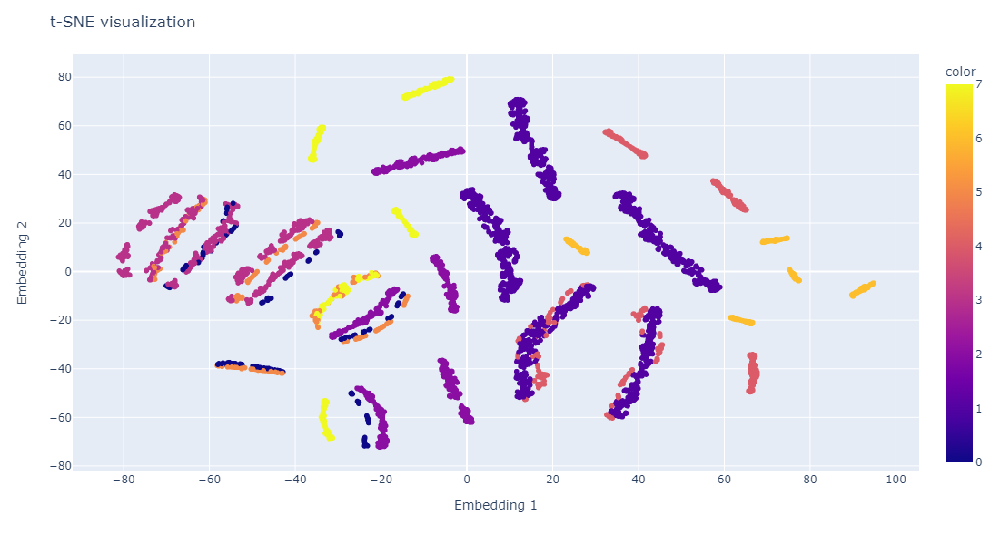

In [24]:
fig = px.scatter(X_tsne, x=X_tsne[:, 0], y=X_tsne[:, 1], color=df_tsne['category'], width=800, height=600)
fig.update_layout(
    title="t-SNE visualization",
    xaxis_title="Embedding 1",
    yaxis_title="Embedding 2",
)
fig.show()

### t-SNE: Sub-cluster analysis

By analyzing the sub-clusters created by t-SNE, we can check if there's some similarity between items that have **Category = 4** and **Category = 2**. 

We picked these 2 categories because there are **2 big clusters** that have samples grouped together from these 2 categories in specific (there are more, but let's focus on these 2).

In [44]:
# Inverse transform label enconding
df_unencoded = pd.DataFrame(le.inverse_transform(df_encoded), columns=df_to_encode.columns)

# Create new dataframe with the t-SNE embeddings
X_tsne_df = pd.DataFrame(X_tsne, columns=['Embedding 1', 'Embedding 2'])

# Concat original df and X_tsne_df
X_tsne_df = pd.concat([X_tsne_df, df_unencoded, df[['age', 'price', 'quantity']]], axis=1)
X_tsne_df.head()

,Embedding 1,Embedding 2,gender,category,payment_method,shopping_mall,age,price,quantity
0,37.865536,24.511440,Female,Clothing,Credit Card,Kanyon,28,1500.40,5
1,33.084293,57.846199,Male,Shoes,Debit Card,Forum Istanbul,21,1800.51,3
2,1.245562,32.835468,Male,Clothing,Cash,Metrocity,20,300.08,1
3,64.438164,25.490633,Female,Shoes,Credit Card,Metropol AVM,66,3000.85,5
4,-54.282288,-37.833790,Female,Books,Cash,Kanyon,53,60.60,4


With the DataFrame above, we can now see what are the actual labels for the instances. Let's check out how the clusters are **grouped** by categories, and how customers can be **targeted** according to their shopping habits.

C:\ProgramData\Anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



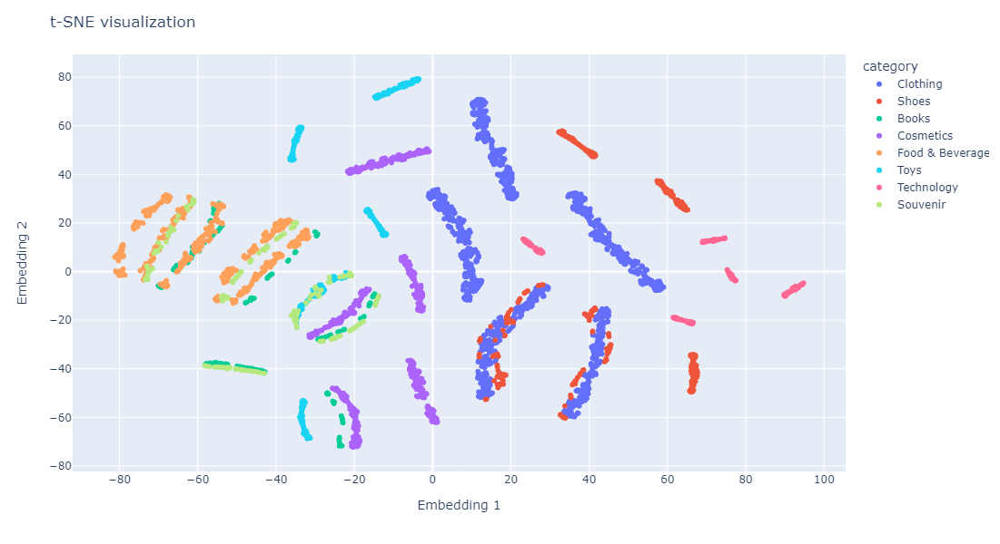

In [50]:
fig = px.scatter(X_tsne_df, x=X_tsne_df['Embedding 1'], y=X_tsne_df['Embedding 2'], color=X_tsne_df['category'], width=800, height=600)
fig.update_layout(
    title="t-SNE visualization",
    xaxis_title="Embedding 1",
    yaxis_title="Embedding 2",
)
fig.show()

By analyzing the plot above, we can conclude that some customers that buy products from category ``Clothing`` are somehow related to the customers that buy products from ``Shoes`` category. 

Despite not having some _ground truth_ about actual customer habits (because we are in a **unsupervised** environment learning, we can make, for example. **targeted Marketing campaigns** for customes that buy products from category ``Clothing`` and ``Shoes`` at the same time.

### UMAP

In [69]:
# Simplify to 5000 instances only
df_umap = df_encoded_full[:5000]

In [82]:
import umap
umap_dr = umap.UMAP(n_jobs=-1, n_neighbors=100)
X_umap = umap_dr.fit_transform(df_umap)
X_umap.shape

C:\Users\António Raimundo\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



(5000, 2)

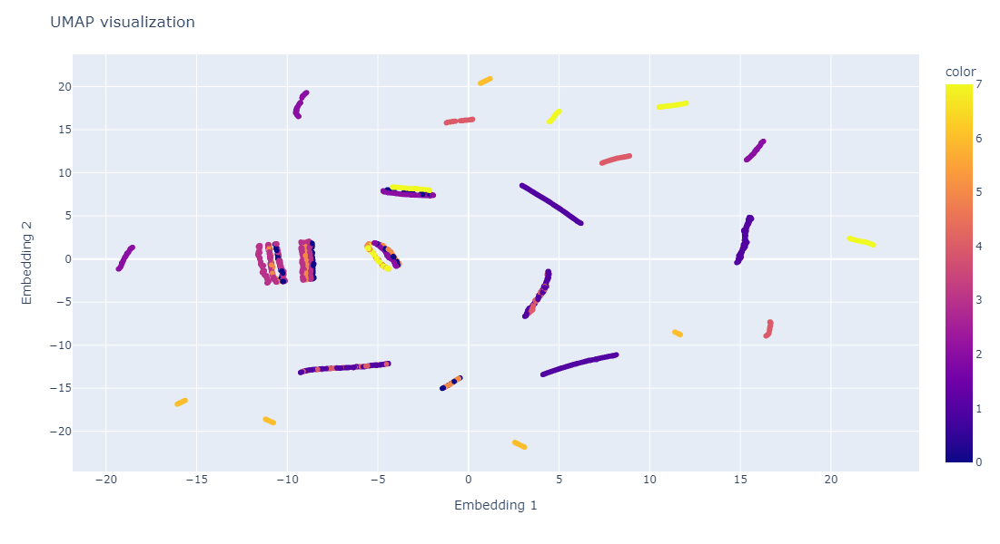

In [83]:
fig = px.scatter(X_umap, x=X_umap[:, 0], y=X_umap[:, 1], color=df_umap['category'], width=800, height=600)
fig.update_layout(
    title="UMAP visualization",
    xaxis_title="Embedding 1",
    yaxis_title="Embedding 2",
)
fig.show()

In [84]:
# Create new dataframe with the t-SNE embeddings
X_umap_df = pd.DataFrame(X_umap, columns=['Embedding 1', 'Embedding 2'])

# Concat original df and X_tsne_df
X_umap_df = pd.concat([X_umap_df, df_unencoded, df[['age', 'price', 'quantity']]], axis=1)
X_umap_df.head()

,Embedding 1,Embedding 2,gender,category,payment_method,shopping_mall,age,price,quantity
0,5.718065,4.830779,Female,Clothing,Credit Card,Kanyon,28,1500.40,5
1,16.643637,-7.325289,Male,Shoes,Debit Card,Forum Istanbul,21,1800.51,3
2,15.526309,4.758387,Male,Clothing,Cash,Metrocity,20,300.08,1
3,-1.133256,15.851434,Female,Shoes,Credit Card,Metropol AVM,66,3000.85,5
4,-1.263186,-14.831181,Female,Books,Cash,Kanyon,53,60.60,4


C:\ProgramData\Anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



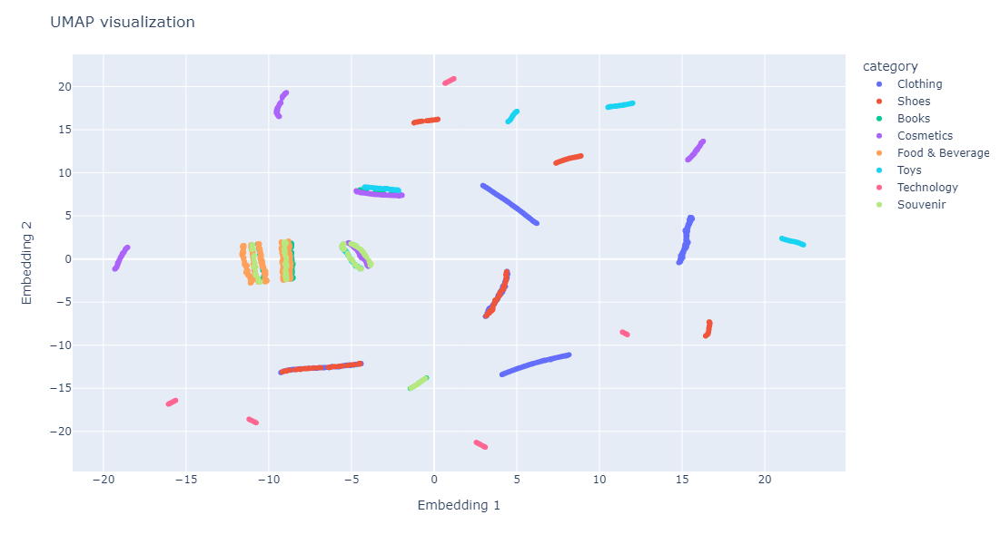

In [85]:
fig = px.scatter(X_umap_df, x=X_umap_df['Embedding 1'], y=X_umap_df['Embedding 2'], color=X_umap_df['category'], width=800, height=600)
fig.update_layout(
    title="UMAP visualization",
    xaxis_title="Embedding 1",
    yaxis_title="Embedding 2",
)
fig.show()